# **Species Aggregation & Clustering Analysis**

A **aggregate** is any transient or stable group of molecular species connected by geometric, intermolecular criteria (e.g., pair-wise distances, angles, etc.). In the materials science literature, the term **aggregates** is commonly used (say when alluding to self-assembly or highly ordered smectic systems); elsewhere, the term **clusters** is also used interchangeably.

### Helper Functions & Environments

In [ ]:
%pip install genice2 networkx py3Dmol
%pip install git+https://github.com/shehan807/mdtraj.git@aggregate-analysis

In [83]:
import tempfile

import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import py3Dmol
from genice2.genice import GenIce
from genice2.plugin import Format, Lattice, Molecule
from matplotlib.ticker import ScalarFormatter

import mdtraj as md

In [91]:
def generate_ice(ice_type, rep=(1, 1, 1), seed=42):
    """Generate ice structure using GenIce2 Python API."""
    np.random.seed(seed)
    lattice = Lattice(ice_type)
    formatter = Format("gromacs")
    water = Molecule("tip3p")
    reshape = [[rep[0], 0, 0], [0, rep[1], 0], [0, 0, rep[2]]]
    gro_content = GenIce(lattice, reshape=reshape).generate_ice(formatter, water=water)

    # Save to temp file and load with MDTraj
    with tempfile.NamedTemporaryFile(suffix=".gro", delete=False, mode="w") as f:
        f.write(gro_content)
        f.flush()
        tmp_path = f.name

    traj = md.load(tmp_path)
    traj._gro_content = gro_content  # Store for visualization
    return traj


def plot_network(G):
    fig, ax = plt.subplots(figsize=(3, 3))
    pos = nx.kamada_kawai_layout(G)
    nx.draw_networkx_nodes(
        G, pos, node_color="lightblue", node_size=500, edgecolors="black", linewidths=0.6, alpha=0.95, ax=ax
    )
    nx.draw_networkx_edges(G, pos, edge_color="dimgray", width=1.5, alpha=0.8, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=9, font_weight="semibold", font_color="black", ax=ax)
    ax.set_aspect("equal")
    ax.axis("off")
    plt.tight_layout(pad=0.2)
    plt.show()


def view_structure(traj, bfactors=None, resname=None, style="ball-stick", show_hydrogens=True):
    """Show 3D structure with py3Dmol."""
    view = py3Dmol.view(width=500, height=400)

    # Use .gro if available and no bfactors, else PDB
    if hasattr(traj, "_gro_content") and bfactors is None:
        view.addModel(traj._gro_content, "gro")
    else:
        with tempfile.NamedTemporaryFile(suffix=".pdb", delete=False, mode="w") as f:
            traj.save_pdb(f.name, bfactors=bfactors)
        with open(f.name) as pdb:
            view.addModel(pdb.read(), "pdb")

    # Style configuration (bfactors are normalized to 0-99)
    bfactor_colors = {"prop": "b", "gradient": "roygb", "min": 0, "max": 99}
    if style == "vdw":
        if bfactors is not None:
            mol_style = {"sphere": {"colorscheme": bfactor_colors}}
        else:
            mol_style = {"sphere": {}}
        other_style = {"sphere": {"color": "gray"}}
    else:
        mol_style = {"stick": {"radius": 0.1}, "sphere": {"scale": 0.25}}
        if bfactors is not None:
            mol_style = {k: {**v, "colorscheme": bfactor_colors} for k, v in mol_style.items()}
        other_style = {"sphere": {"color": "gray", "scale": 0.3}}

    # Apply styles
    selector = {"resn": resname} if resname else {}
    view.setStyle(selector, mol_style)

    # Show other residues (e.g., anions) in gray
    if resname:
        view.setStyle({"not": {"resn": resname}}, other_style)

    if not show_hydrogens:
        view.setStyle({**selector, "elem": "H"}, {})

    view.setBackgroundColor("white")
    view.zoomTo()
    return view.show()


def aggregate_bfactors(traj, graphs, residue_indices):
    """Map aggregate IDs to per-atom B-factor values for PDB visualization."""
    n_frames, n_atoms = len(graphs), traj.n_atoms
    bfactors = np.full((n_frames, n_atoms), -1.0, dtype=np.float32)

    res_to_atoms = {r: [a.index for a in traj.topology.residue(r).atoms] for r in residue_indices}

    for frame_idx, G in enumerate(graphs):
        components = list(nx.connected_components(G))
        n_agg = len(components)
        for agg_id, component in enumerate(components):
            # Normalize to 0-99 range for PDB B-factor limits
            val = (agg_id * 99.0 / (n_agg - 1)) if n_agg > 1 else 0.0
            for mol_idx in component:
                for atom_idx in res_to_atoms[residue_indices[mol_idx]]:
                    bfactors[frame_idx, atom_idx] = val

    return bfactors


def plot_size_distribution(results):
    """Plot aggregate size distribution comparison for multiple systems."""
    n_systems = len(results)
    fig, axes = plt.subplots(1, n_systems, figsize=(6 * n_systems, 5))
    axes = [axes] if n_systems == 1 else axes

    for idx, (name, data) in enumerate(results.items()):
        ax = axes[idx]
        sizes = np.array(data["sizes"])
        max_size = max(sizes)
        total_molecules = sizes.sum()

        if max_size > 10:
            bins = np.logspace(0, np.log10(max_size + 1), 30)
            ax.set_xscale("log")
            ax.xaxis.set_major_formatter(ScalarFormatter())
            ax.ticklabel_format(style="plain", axis="x")
        else:
            bins = range(1, max_size + 2)

        ax.hist(sizes, bins=bins, weights=sizes / total_molecules, edgecolor="black", alpha=0.7)
        ax.set_xlabel("Aggregate Size (# of Cations)")
        ax.set_ylabel("Fraction of Total # of Cations")
        ax.set_title(
            f"{name} ({len(data['config']['chain_carbons'])} chain carbons)\n"
            f"{len(sizes)} aggregates, largest = {max_size}"
        )
        ax.axvline(np.mean(sizes), color="red", linestyle="--", label=f"Mean: {np.mean(sizes):.1f}")
        ax.legend()

    plt.tight_layout()
    plt.show()

## **Example 1**: Ice Polymorphs

Ice polymorphs offer an excellent verification and illustration of a correctly working **`md.compute_aggregate()`** analysis. In any ice crystal, each `HOH` molecule is hydrogen-bonded to its neighbors (average of 4). Thus, for most polymorphs, all water molecules should form a *single*, connected aggregate.

First, lets use [GenIce2](https://github.com/vitroid/GenIce) to create a small cubic ice crystal of 8 `HOH` molecules with a 1x1x1 unit cell.

In [92]:
traj = generate_ice("1c", rep=(1, 1, 1))
view = view_structure(traj)
print(f"Ice (1c) 1x1x1: {traj.n_residues} HOH molecules, {traj.n_atoms} atoms")

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Ice (1c) 1x1x1: 8 HOH molecules, 24 atoms


We conduct the aggregation analysis of this ice crystal by specifying a criteria dictionary. We'll treat molecules as **nodes** joined by **edges** when pairs of molecules pass the criteria. From their, we'll collect the (1) aggregate **size** (in number of molecules), and (2) the **[graph diameter](https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.distance_measures.diameter.html)**, i.e., the longest shortest path formed by any two species within the aggregate.

Number of aggregates: 1
Aggregate size: [8] (HOH molecules)
Edge count: 14
Graph diameter: [3] (hbond edges)


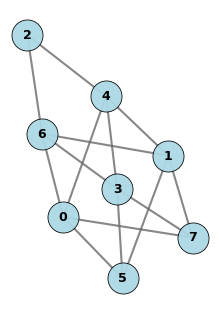

In [95]:
# specify intermolecular edge criteria for aggregate membership
hbond_criteria = {
    "atom_pair": ("H", "O"),
    "distance": 0.20,  # nm
    "atom_triplet": ("O", "H", "O"),
    "angle": 160.0,  # degrees
}

# get list of edges, where molecules are nodes and passed intermolecular criteria form edges
edges, residue_indices = md.compute_aggregates(traj, residue="HOH", criteria=hbond_criteria, periodic=True)

# compute size of aggregate(s) and graph diameter
sizes, diameters, graph = md.compute_aggregate_metrics(
    edges,
    n_molecules=len(residue_indices),
    return_graphs=True,
)

print(f"Number of aggregates: {len(sizes[0])}")
print(f"Aggregate size: {sizes[0]} (HOH molecules)")
print(f"Edge count: {len(edges[0])}")
print(f"Graph diameter: {diameters[0]} (hbond edges)")
plot_network(graph[0])

### Additional Verification

Similarly, various other ice structures yield the same result, where only 1 aggregate is found containing all `HOH` molecules in the structure.


In [101]:
ice_types = [
    ("1c", "Cubic ice I"),
    ("1h", "Hexagonal ice I"),
    ("2", "Ice II"),
    ("3", "Ice III"),
    ("5", "Ice V"),
    ("9", "Ice IX"),
    ("12", "Ice XII"),
]

for ice_type, name in ice_types:
    traj = generate_ice(ice_type, rep=(1, 1, 1), seed=42)
    edges, residue_indices = md.compute_aggregates(traj, residue="HOH", criteria=hbond_criteria, periodic=True)
    sizes, _ = md.compute_aggregate_metrics(
        edges,
        n_molecules=len(residue_indices),
    )
    print(f"{name}: {sizes[0]}")
    assert len(sizes[0]) == 1

Cubic ice I: [8]
Hexagonal ice I: [16]
Ice II: [12]
Ice III: [12]
Ice V: [28]
Ice IX: [12]
Ice XII: [24]


## **Example 2**: Ionic Liquid Alkyl Chain Aggregation

Some condensed-phase systems transition from isotropic liquids to liquid-crystalline phases via aggregate formation, a behavior common in ionic liquids with bulky, long-alkyl-chain cations. Here, we reveal the stark difference between MD trajectories of C8MIM/BF4 and C16MIM/BF4 by an aggregation analysis.

The `criteria` input supports **logical `AND` / `OR` combinations**, allowing multiple conditions to be imposed when deciding whether an edge is formed between two molecular nodes. With `AND`, all conditions must be satisfied; with `OR`, at least one condition is sufficient. In Example 1, we saw the `AND` logic used (distance and angle criteria).

This flexibility is particularly useful for identifying **alkyl-chain aggregates**. In this example, two alkyl chains are considered connected if **at least one pair of carbon atoms** (one from each chain) lies within **`0.40` nm** of each other, a distance chosen to correspond approximately to the first peak of the radial distribution function.

In [102]:
# carbon-carbon intermolecular chain distance
CUTOFF = 0.40

# specify system-specific pdb, residue name, and *all* carbon atom types
SYSTEMS = {
    "C8MIM/BF4": {
        "pdb": "C8MIM_BF4_400K_UA.pdb",
        "cation_resname": "C8M",
        "chain_carbons": ["C51", "C52", "C53", "C54", "C55"],
    },
    "C16MIM/BF4": {
        "pdb": "C16MIM_BF4_400K_UA.pdb",
        "cation_resname": "C16",
        "chain_carbons": [
            "C51",
            "C52",
            "C53",
            "C54",
            "C55",
            "C56",
            "C57",
            "C58",
            "C59",
            "C510",
            "C511",
            "C512",
            "C513",
        ],
    },
}

Now, we can run **`md.compute_aggregates()`** for C8MIM/BF4 vs. C16MIM/BF4 to show how **long-range order can be understand via aggregate size distributions**:.

System     Carbons per chain    Total cations    Aggregates   Largest    Mean      
-----------------------------------------------------------------------------------
C8MIM/BF4  5                    1600             863          15         1.9       
C16MIM/BF4 13                   1600             30           1568       53.3      


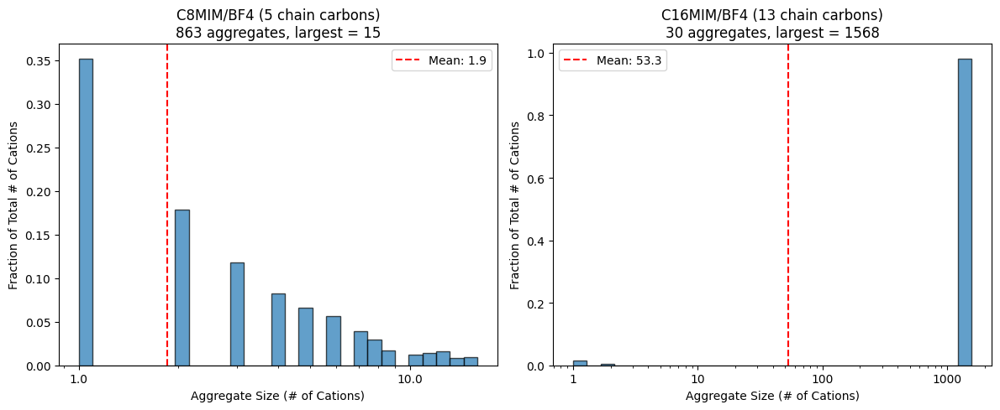

In [103]:
results = {}

header = (
    f"{'System':<10} {'Carbons per chain':<20} {'Total cations':<16} {'Aggregates':<12} {'Largest':<10} {'Mean':<10}"
)

print(header)
print("-" * len(header))

for name, config in SYSTEMS.items():
    traj = md.load(config["pdb"])

    criteria = {"atom_pair": (config["chain_carbons"], config["chain_carbons"]), "distance": CUTOFF}

    edges, residue_indices = md.compute_aggregates(
        traj, residue=config["cation_resname"], criteria=criteria, periodic=True
    )

    sizes, diameters, graphs = md.compute_aggregate_metrics(edges, len(residue_indices), return_graphs=True)

    results[name] = {
        "traj": traj,
        "edges": edges,
        "graphs": graphs,
        "residue_indices": residue_indices,
        "sizes": sizes[0],
        "config": config,
    }

    n_cations = len(residue_indices)

    print(
        f"{name:<10} "
        f"{len(config['chain_carbons']):<20} "
        f"{n_cations:<16} "
        f"{len(sizes[0]):<12} "
        f"{max(sizes[0]):<10} "
        f"{np.mean(sizes[0]):<10.1f}"
    )

plot_size_distribution(results)

By leveraging the B-factor column of the pdb file format, we can highlight each unique aggregate with a separate color, along with setting all BF4 anions to gray.

In [104]:
data = results["C8MIM/BF4"]
bfactors = aggregate_bfactors(data["traj"], data["graphs"], data["residue_indices"])

print(f"C8MIM/BF4: {len(data['sizes'])} aggregates colored by ID")
view_structure(data["traj"], bfactors=bfactors[0], resname=data["config"]["cation_resname"], style="vdw")

data = results["C16MIM/BF4"]
bfactors = aggregate_bfactors(data["traj"], data["graphs"], data["residue_indices"])

print(f"C16MIM/BF4: {len(data['sizes'])} aggregates colored by ID")
view_structure(data["traj"], bfactors=bfactors[0], resname=data["config"]["cation_resname"], style="vdw")

C8MIM/BF4: 863 aggregates colored by ID


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

C16MIM/BF4: 30 aggregates colored by ID


3Dmol.js failed to load for some reason. Please check your browser console for error messages.